# **545 Project Group 7 - Bitcoin Crypto Price Prediction**

# Overview: Bitcoin Forecasting and Tweet Sentiment Analysis

**Team 7: April Hishinuma, Chin Jung Cheng, Shengyun Huang**

Cryptocurrency is storming the world, and many supporters are racing to buy them now before it becomes more valuable. Because of its volatility, there is a high demand to try and predict what the prices will look like in the future. This project will look into time series forecasting with cryptocurrency prices, and allow users to see potential trends in the cryptocurrency market. This is a project inspired by the [G-Research Crypto forecasting competition](link), where participants have the challenge to predict prices returns across a bundle of major cryptocurrencies. 

We decided for our project we would focus on Bitcoin. Our goal for this project was to learn how clean large data sets, learn how to do timeseries anaysis, and learn what kind of models work best for our project. 

There are **6 main parts** to this project:
1. Data Cleaning of Bitcoin Prices Data Set and Bitcoin Twitter Sentiment
2. Exploratory Data Analysis (EDA) 
3. ARIMA Time Series Analysis of the Price
4. Neural Networking Prediction of the Price using the Twitter Volume and Twitter Sentiment
5. Challenges/Obstacles Faced
6. Future Direction

# Part 1: Data Cleaning of Bitcoin Prices and Bitcoin Tweets
1. Import the Modules 
2. Clean, preprocess, and inspect the bitcoin price data 
3. Clean, preprocess, inspect, and perform sentiment analysis on the bitcoin tweets

## Part 1.1 Import Modules

In [1]:
!pip install pytrends

import pandas as pd
import numpy as np
from datetime import datetime

# Google Trends
from pytrends.request import TrendReq

# Natural Language Preprocessing
import re   
import nltk 
from nltk.tokenize import RegexpTokenizer
from nltk.stem.porter import *
from nltk.sentiment.vader import SentimentIntensityAnalyzer

# Plotting functions
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots
from PIL import Image
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
from collections import Counter
import plotly.express as px

# Neural Network functions
from sklearn.preprocessing import MinMaxScaler
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import train_test_split
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
from numpy import concatenate
from math import sqrt

/opt/conda/lib/python3.7/site-packages/nltk/twitter/__init__.py:20: UserWarning: The twython library has not been installed. Some functionality from the twitter package will not be available.
  warnings.warn("The twython library has not been installed. "


## Part 1.2 [ Bitcoin Price Data Features](https://www.kaggle.com/c/g-research-crypto-forecasting/overview)
We can see the different features included in the dataset. Specifically, the features included per asset are the following:
*   **timestamp**: All timestamps are returned as second Unix timestamps (the number of seconds elapsed since 1970-01-01 00:00:00.000 UTC). Timestamps in this dataset are multiple of 60, indicating minute-by-minute data.
*   **Asset_ID**: The asset ID corresponding to one of the crytocurrencies (e.g. `Asset_ID = 1` for Bitcoin). The mapping from `Asset_ID` to crypto asset is contained in `asset_details.csv`.
*   **Count**: Total number of trades in the time interval (last minute).
*   **Open**:	Opening price of the time interval (in USD).
*   **High**:	Highest price reached during time interval (in USD).
*   **Low**: Lowest price reached during time interval (in USD).
*   **Close**:	Closing price of the time interval (in USD).
*   **Volume**:	Quantity of asset bought or sold, displayed in base currency USD.
*   **VWAP**: The average price of the asset over the time interval, weighted by volume. VWAP is an aggregated form of trade data.
*   **Target**: Residual log-returns for the asset over a 15 minute horizon. 

The first two columns define the time and asset indexes for this data row. The 6 middle columns are feature columns with the trading data for this asset and minute in time. The last column is the prediction target, which we will get to later in more detail.

We also view the asset information, including the list of all assets, the `Asset_ID` to asset mapping, and the weight of each asset used to weigh their relative importance in the evaluation metric.

### Cleaning Bitcoin Price Data
#### Cheking for missing data and resample timestamps to daily
* We loaded in the crypto data using the g-research-crypto-forecasting and instepcted its contents
* Below we check how much missing data there is with btc and eth. For missing price, we are filling the blank with the last close price. 
* We also check the time range for Bitcoin and Ethereum data, using the coversion from timestamp to `datetime`.
* Missing asset data, for a given minute, is not represented by NaN's, but instead by the absence of those rows. We can check the timestamp difference between consecutive rows to see if there is missing data.
* We used the padding method to fill in missing data with previous price
* Once we confirmed there was no missing data, we resampled the data so that it reflects the daily price

In [2]:
# Import the crypto Data
data_folder = "../input/g-research-crypto-forecasting/"
!ls $data_folder

asset_details.csv	       example_test.csv  supplemental_train.csv
example_sample_submission.csv  gresearch_crypto  train.csv


In [3]:
# Read CSV and View data
crypto_df = pd.read_csv(data_folder + 'train.csv')
crypto_df.head(10)

,timestamp,Asset_ID,Count,Open,High,Low,Close,Volume,VWAP,Target
0,1514764860,2,40.0,2376.580000,2399.5000,2357.1400,2374.590000,19.233005,2373.116392,-0.004218
1,1514764860,0,5.0,8.530000,8.5300,8.5300,8.530000,78.380000,8.530000,-0.014399
2,1514764860,1,229.0,13835.194000,14013.8000,13666.1100,13850.176000,31.550062,13827.062093,-0.014643
3,1514764860,5,32.0,7.659600,7.6596,7.6567,7.657600,6626.713370,7.657713,-0.013922
4,1514764860,7,5.0,25.920000,25.9200,25.8740,25.877000,121.087310,25.891363,-0.008264
5,1514764860,6,173.0,738.302500,746.0000,732.5100,738.507500,335.987856,738.839291,-0.004809
6,1514764860,9,167.0,225.330000,227.7800,222.9800,225.206667,411.896642,225.197944,-0.009791
7,1514764860,11,7.0,329.090000,329.8800,329.0900,329.460000,6.635710,329.454118,NaN
8,1514764920,2,53.0,2374.553333,2400.9000,2354.2000,2372.286667,24.050259,2371.434498,-0.004079
9,1514764920,0,7.0,8.530000,8.5300,8.5145,8.514500,71.390000,8.520215,-0.015875


In [4]:
crypto_df.shape

(24236806, 10)

In [5]:
# Use just BTC only and convert timestamp
crypto_priority_df=crypto_df[(crypto_df.Asset_ID==1) | (crypto_df.Asset_ID==6)]
crypto_priority_df['timestamp']=crypto_priority_df['timestamp'].astype('datetime64[s]') # convert timestamp to yyyy-mm-dd
crypto_priority_df.shape

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


(3912482, 10)

In [6]:
crypto_priority_df.head()

,timestamp,Asset_ID,Count,Open,High,Low,Close,Volume,VWAP,Target
2,2018-01-01 00:01:00,1,229.0,13835.1940,14013.80,13666.11,13850.1760,31.550062,13827.062093,-0.014643
5,2018-01-01 00:01:00,6,173.0,738.3025,746.00,732.51,738.5075,335.987856,738.839291,-0.004809
10,2018-01-01 00:02:00,1,235.0,13835.0360,14052.30,13680.00,13828.1020,31.046432,13840.362591,-0.015037
13,2018-01-01 00:02:00,6,192.0,738.5075,745.14,732.49,738.2600,232.793141,738.268967,-0.004441
18,2018-01-01 00:03:00,1,528.0,13823.9000,14000.40,13601.00,13801.3140,55.061820,13806.068014,-0.010309


### Check Missing Data
From the above information we can see that each row of the data set has the trading data for an asset, at a given minute timestamp, described in detail below. Now we will check if there is any missing data.

In [7]:
# Convert the time stamp from timestamp to `datetime`.
btc = crypto_priority_df[crypto_priority_df["Asset_ID"]==1].set_index("timestamp") # Asset_ID = 1 for Bitcoin
btc_mini = btc.iloc[-200:] # Select recent data rows

In [8]:
# Check if there any Nan values
btc.isna().sum()

Asset_ID      0
Count         0
Open          0
High          0
Low           0
Close         0
Volume        0
VWAP          0
Target      304
dtype: int64

In [9]:
# check missing minute data
def check_missing_data(data):
    # get timestamp difference between consecutive entries
    missing_minute_counts = (data.index[1:]-data.index[:-1]).value_counts()

    total_minutes_missing = 0 

    for i in range(len(missing_minute_counts)):    
        minute_gap = missing_minute_counts.index.values[i]/60000000000
        minutes_missing = int((minute_gap - 1) * missing_minute_counts[i])            
        total_minutes_missing += minutes_missing

    total_minutes_of_data = len(btc)
    percentage_missing_data = total_minutes_missing / (total_minutes_of_data + total_minutes_missing) * 100
    print('data goes from %s to %s' % (data.index[0], data.index[-1]))
    print("total_minutes_missing =", total_minutes_missing)
    print("total_minutes_of_data =", total_minutes_of_data)
    print("percentage missing data: %f percent" % percentage_missing_data)
print('for bitcoin')
check_missing_data(btc)

# (btc.index[1:]-btc.index[:-1]).value_counts().head()

for bitcoin
data goes from 2018-01-01 00:01:00 to 2021-09-21 00:00:00
total_minutes_missing = 678
total_minutes_of_data = 1956282
percentage missing data: 0.034646 percent


In [10]:
# Use padding method to fill in missing data with previous price
btc = btc.reindex(pd.date_range(btc.index.min(),btc.index.max(),freq="T"),method='pad')

### Missing data was filled in successfully 
After we padded the data, went from 0.034646 percent to 0%. 

In [11]:
# Confirm there is no missing data
check_missing_data(btc)

(btc.index[1:]-btc.index[:-1]).value_counts().head()

data goes from 2018-01-01 00:01:00 to 2021-09-21 00:00:00
total_minutes_missing = 0
total_minutes_of_data = 1956960
percentage missing data: 0.000000 percent


0 days 00:01:00    1956959
dtype: int64

### Resample Timestamps for Bitcoin Price to Daily
In order for our data to match bitcoin tweets data, we must resample all of the data points to daily. 

In [12]:
# Resample the timestamps to daily
logic = {'Open'  : 'first',
         'High'  : 'max',
         'Low'   : 'min',
         'Close' : 'last',
         'Volume': 'sum',
         'Count'  : 'sum'}

btc_daily = btc.drop(columns = ['VWAP', 'Target', 'Asset_ID']).resample('D').apply(logic)
btc_daily

,Open,High,Low,Close,Volume,Count
2018-01-01,13835.194000,14442.90,12750.00,13432.918000,57823.038455,365257.0
2018-01-02,13427.492000,15500.00,12798.00,14746.112000,105520.435396,574564.0
2018-01-03,14748.296000,15599.70,14150.00,15101.994000,83836.040636,518239.0
2018-01-04,15102.012000,15500.10,13918.04,15154.760000,101131.761732,565945.0
2018-01-05,15154.766000,17200.00,14600.00,16949.880000,108707.001143,595440.0
...,...,...,...,...,...,...
2021-09-17,47759.261429,48185.90,46699.56,47295.470000,64536.734734,2125227.0
2021-09-18,47297.769495,48843.20,47030.00,48307.068750,56469.654645,1830084.0
2021-09-19,48304.237500,48389.52,46816.20,47243.398750,53547.906275,1685481.0
2021-09-20,47247.514286,47358.92,42453.97,43017.277143,166759.267653,4099658.0


##  Part 1.3 [Bitcoin Tweets Data Features](https://www.kaggle.com/kaushiksuresh147/bitcoin-tweets)

The tweets have #Bitcoin and #btc hashtag. Collection star started on 2/06/2021, with an initial 1 lakh tweets, and will continue on a daily basis. 

* **user_name:** The name of the user, as they’ve defined it.
* **user_location:** The user-defined location for this account’s profile.
* **user_description:** The user-defined UTF-8 string describing their account.
* **user_created:** Time and date, when the account was created.
* **user_followers:** The number of followers an account currently has.
* **user_friends:** The number of friends a account currently has.
* **user_favourites:** The number of favorites a account currently has
* **user_verified:** When true, indicates that the user has a verified account
* **date:** UTC time and date when the Tweet was created
* **text:** The actual UTF-8 text of the Tweet
* **hashtags:** All the other hashtags posted in the tweet along with #Bitcoin & #btc
* **source:** Utility used to post the Tweet, Tweets from the Twitter website have a source value - web
* **is_retweet:** Indicates whether this Tweet has been Retweeted by the authenticating user.

### Cheking for missing data and resample timestamps to daily

* We loaded in the tweet using the bitcoin-tweets and instepcted its contents
* Dropped any column with missing text data 
* Resampled the timestamps to daily
* Tokenized the tweets and applied a sentiment score using NLT

In [13]:
# Read in the data
bc_file = '../input/bitcoin-tweets/Bitcoin_tweets.csv'
bc_df = pd.read_csv(bc_file)
bc_df = bc_df[['date', 'text']]

/opt/conda/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3441: DtypeWarning: Columns (5,6,7,12) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


In [14]:
# Drop the null values
bc_df = bc_df.dropna()

# Convert date into datetime obj
bc_df['date'] = pd.to_datetime(bc_df['date'], errors='coerce').dt.date 
bc_df

,date,text
0,2021-02-10,Blue Ridge Bank shares halted by NYSE after #b...
1,2021-02-10,"😎 Today, that's this #Thursday, we will do a ""..."
2,2021-02-10,"Guys evening, I have read this article about B..."
3,2021-02-10,$BTC A big chance in a billion! Price: \487264...
4,2021-02-10,This network is secured by 9 508 nodes as of t...
...,...,...
1950238,2021-12-11,[SCAN RESULTS - 4h]\n\nExchange: #KuCoin\n\nTo...
1950239,2021-12-11,#BTC is now at $48522.45
1950240,2021-12-11,Very interesting TA from @MMCrypto for #BTC ht...
1950241,2021-12-11,Something interested I noticed is #ETH ( Pink ...


### Bitcoin Price Data has more samples than Bitcoin Tweet Data
Something to notice is that from 2021-02-10 to 2021-12-11, there are 1,950,228 tweets sampled. The bitcoin price has around 24 million samples from 2018-01-01 to 2021-09-21 and it a more exhaustive data set. This might affect the model that we are using for the neural network. We hypothesize that this can bias the correlation between volume, sentiment, or price later on. We will only compare those dates of overlap.

In [15]:
# Insepct the text data
for i in range(5):
    print(bc_df["text"][i])

Blue Ridge Bank shares halted by NYSE after #bitcoin ATM announcement https://t.co/xaaZmaJKiV @MyBlueRidgeBank… https://t.co/sgBxMkP1SI
😎 Today, that's this #Thursday, we will do a "🎬 Take 2" with our friend @LeoWandersleb, #Btc #wallet #security expe… https://t.co/go6aDgRml5
Guys evening, I have read this article about BTC and would like to share with you all - https://t.co/QxCZgmuy3B… https://t.co/o6wn7ppkVY
$BTC A big chance in a billion! Price: \4872644.0 (2021/02/11 08:51) #Bitcoin #FX #BTC #crypto
This network is secured by 9 508 nodes as of today. Soon, the biggest bears will recognise: #BTC in too big to fail… https://t.co/1XovDA8rKw


## Findings on Bitcoin Tweets
### 1. Bitcoin Tweets have a lot of noise
After looking at the data, there seems to be a lot of non-stopwords, #'s and emojis that will not be good for sentiment analysis. Thus it is important to remove bad patterns and numbers, and tokenize for NLTK processing.

### 2. Bitcoin Tweets are in English
There is no comment about this in the documentation, but there isn't a trace of other languages, which means this sampling data was most likely done in an English speaking country. It does not take into account world wide data. This means that the country that was sampled could potentially bias the data.

**Steps for processing text data:**
1. Remove the bad patterns 
2. Tokenize the content 
3. Refore into a sentence for sentiment analysis

In [16]:
# Clean the data by removing non-alphabetical letters 
def remove_bad_patterns(text):
    pattern = r"[^a-zA-Z0-9 ]|https"
    return re.sub(pattern, repl="", string=text)
 
bc_df['text'] = bc_df['text'].apply(remove_bad_patterns)

# NLTK tokenizer
from nltk.corpus import stopwords
nltk.download('stopwords')
stopwords = set(stopwords.words('english')) 

def tokenize_content(content):
  """returns tokenized string

  :param content: text string
  :return: tokenized text/list of words
  """
  token_list = [token.lower() for token in nltk.word_tokenize(content)]
  t = [token for token in token_list if token not in stopwords and token.isalpha() and token != 'https']
  return t

def make_sentence(word_list):
  """returns string 

  :param content: list of words
  :return: string that represents sentence
  """
  sentence = ""
  for word in word_list:
    sentence += word + ' '
  return sentence

# Tokenize and filter for stop words
bc_df['tokens']  = bc_df['text'].apply(tokenize_content)

# Store cleaned data
bc_df['text'] = bc_df['tokens'].apply(make_sentence)

[nltk_data] Downloading package stopwords to /usr/share/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


### Performing Sentiment Analysis

We used VADER in the nltk package for sentiment analysis.[ VADER (Valence Aware Dictionary and Sentiment Reasoner)](https://www.nltk.org/api/nltk.sentiment.vader.html) is a lexicon and rule-based sentiment analysis tool that is specifically attuned to sentiments expressed in social media.’

**Vader scores are as follows:**
* neg, pos, and neu sum to 1 
* compound goes from -1 (most negative) to 1 (most positive)
    * positive sentiment : (compound score >= 0.05) 
    * neutral sentiment : (compound score > -0.05) and (compound score < 0.05) 
    * negative sentiment : (compound score <= -0.05)

In [17]:
def sentiment(c):
    """returns string sentiment

      :param content: compound score
      :return: string sentiment
      """
    if c >= 0.05:
        return 'pos'
    elif c <= -0.05:
        return 'neg'
    else:
        return 'neu'
    
# Compute the sentiment score
sid = SentimentIntensityAnalyzer()
bc_df['compound'] = bc_df['text'].apply(lambda x:sid.polarity_scores(x)['compound'])
bc_df['sentiment'] = bc_df['compound'].apply(sentiment)
bc_df.head()

,date,text,tokens,compound,sentiment
0,2021-02-10,blue ridge bank shares halted nyse bitcoin atm...,"[blue, ridge, bank, shares, halted, nyse, bitc...",0.2960,pos
1,2021-02-10,today thats thursday take friend leowandersleb...,"[today, thats, thursday, take, friend, leowand...",0.6808,pos
2,2021-02-10,guys evening read article btc would like share,"[guys, evening, read, article, btc, would, lik...",0.5719,pos
3,2021-02-10,btc big chance billion price bitcoin fx btc cr...,"[btc, big, chance, billion, price, bitcoin, fx...",0.2500,pos
4,2021-02-10,network secured nodes today soon biggest bears...,"[network, secured, nodes, today, soon, biggest...",-0.2023,neg


### Check how well the NLTK sentiment analyser performs
Below we checked how well the nltk sentiment analyzer does. From a quick glance, we think it performs great and we can trust the sentiment scores.

In [18]:
#Create DataFrames for each sentiment        
neg = bc_df[bc_df['sentiment'] == 'neg']
pos = bc_df[bc_df['sentiment'] == 'pos']
neu = bc_df[bc_df['sentiment'] == 'neu']

# # Check Positive Scores texts 
display(pos.nlargest(5, ['compound']))

# Check Negative Score
display(neg.nsmallest(5, ['compound']))

,date,text,tokens,compound,sentiment
1832399,2021-11-18,good morning beautiful smart sexy girl hope mo...,"[good, morning, beautiful, smart, sexy, girl, ...",0.9921,pos
590441,2021-07-23,airdropdet great super awesome projectvery ama...,"[airdropdet, great, super, awesome, projectver...",0.9912,pos
658662,2021-07-28,cryptocom wow great news congratulation achiev...,"[cryptocom, wow, great, news, congratulation, ...",0.9912,pos
1584433,2021-10-29,shibsol great super awesome projectvery amazin...,"[shibsol, great, super, awesome, projectvery, ...",0.9912,pos
1482585,2021-10-20,wsecretswsc great excellent project also rewar...,"[wsecretswsc, great, excellent, project, also,...",0.9910,pos


,date,text,tokens,compound,sentiment
1785092,2021-11-19,fear fear fear fear fear fear fear fear fear f...,"[fear, fear, fear, fear, fear, fear, fear, fea...",-0.9894,neg
864998,2021-08-20,world war war alcohol world war war drugs war ...,"[world, war, war, alcohol, world, war, war, dr...",-0.9869,neg
1219061,2021-09-10,past present future asteroid volatility slam k...,"[past, present, future, asteroid, volatility, ...",-0.9837,neg
129500,2021-06-23,bbgafrica debt sin debt slavery debt endless d...,"[bbgafrica, debt, sin, debt, slavery, debt, en...",-0.9833,neg
422849,2021-07-22,dumb politicians dumb things dumb governments ...,"[dumb, politicians, dumb, things, dumb, govern...",-0.9829,neg


### Create dataframe for volume and average sentiment for bitcoin tweets
Get the data ready to plug into the neural network.

In [19]:
# Create Counts for each sentiment 
volume_df  = pd.DataFrame(bc_df.value_counts(['date'])).rename(columns={0: 'counts'})
volume_neg_df = pd.DataFrame(neg.value_counts(['date'])).rename(columns={0: 'counts'})
volume_pos_df = pd.DataFrame(pos.value_counts(['date'])).rename(columns={0: 'counts'})
volume_neu_df = pd.DataFrame(neu.value_counts(['date'])).rename(columns={0: 'counts'})

# Lable 
volume_neg_df['label'] = "neg"
volume_pos_df['label'] = "pos"
volume_neu_df['label'] = "neu"

# Total Volume Posts
volume_df = volume_df.reset_index().sort_values(by='date', ascending=True)
volume_neg_df = volume_neg_df.reset_index().sort_values(by='date', ascending=True)
volume_pos_df = volume_pos_df.reset_index().sort_values(by='date', ascending=True)
volume_neu_df = volume_neu_df.reset_index().sort_values(by='date', ascending=True)

# Avg. Overall Sentiment Score Per Day
compound_df = bc_df.groupby('date')['compound'].mean().reset_index().sort_values(by='date', ascending=True)

### Inner Join on Bitcoin Price Data Set with Tweet Sentiment Data Set
When joining, inner join on the date.

In [20]:
# Combine the volume and compound dataset
sentiment_df = volume_df
sentiment_df['compound'] = compound_df['compound']
sentiment_df=sentiment_df.set_index('date')

#inner join btc dataset with tweet sentiment dataset
btc_tweet_daily=btc_daily.merge(sentiment_df, left_index=True, right_index=True)
btc_tweet_daily=btc_tweet_daily.rename(columns={"counts": "Tweet_Counts", "compound": "Tweet_Compound"})

btc_tweet_daily_O=btc_daily.merge(sentiment_df, left_index=True, right_index=True, how="outer")
btc_tweet_daily_O=btc_tweet_daily_O.rename(columns={"counts": "Tweet_Counts", "compound": "Tweet_Compound"})
btc_tweet_daily_O=btc_tweet_daily_O.fillna(0)
btc_tweet_daily_O.head()

,Open,High,Low,Close,Volume,Count,Tweet_Counts,Tweet_Compound
2018-01-01,13835.194,14442.9,12750.00,13432.918,57823.038455,365257.0,0.0,0.0
2018-01-02,13427.492,15500.0,12798.00,14746.112,105520.435396,574564.0,0.0,0.0
2018-01-03,14748.296,15599.7,14150.00,15101.994,83836.040636,518239.0,0.0,0.0
2018-01-04,15102.012,15500.1,13918.04,15154.760,101131.761732,565945.0,0.0,0.0
2018-01-05,15154.766,17200.0,14600.00,16949.880,108707.001143,595440.0,0.0,0.0


## Obstacle - joining two datasets
We started with the bitcoin inner joining the tweet dataset first but also wanted to try the outer join with fillna(0). We will showcase more of the exploratory process between the two in Part 4.

# Part 2: Exploratory Data Analysis (EDA)

1. Explore Bitcoin Data Set and Visualize any trends 
2. Explore Tweet Sentiments Analysis and any trends

## Part 2.1 Bitcoin Price Data Set EDA

### Exploring distribution of the variables and correlation among the variables

<AxesSubplot:title={'center':'BitCoin Prices Correlation'}>

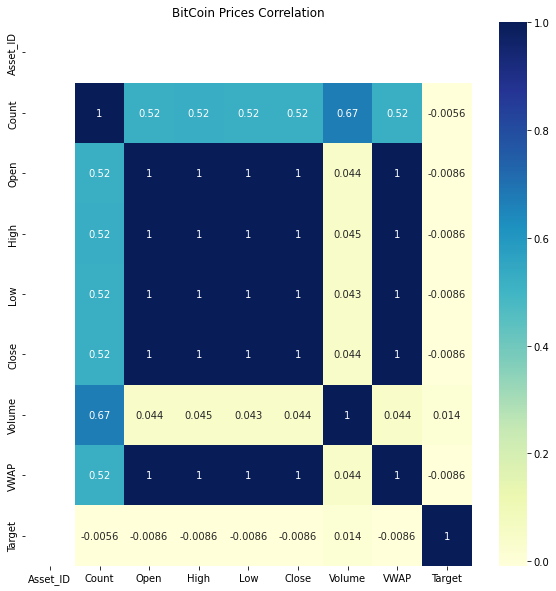

In [22]:
plt.subplots(figsize=(10,10))
plt.title('BitCoin Prices Correlation')
sns.heatmap(btc.corr(),annot=True, cmap="YlGnBu")


From the correlation above, we decided to keep Open, High, Low, Close and Volumn as the inputs.

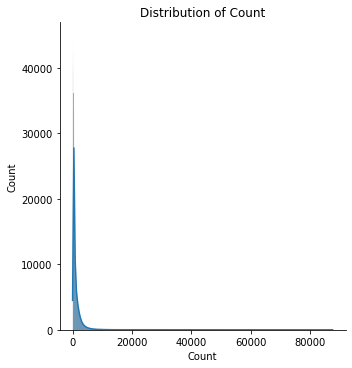

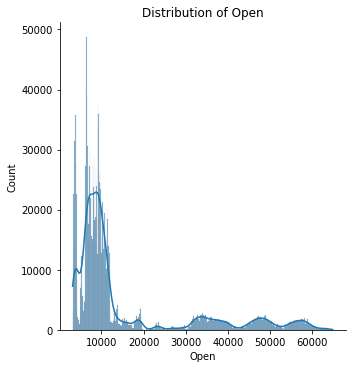

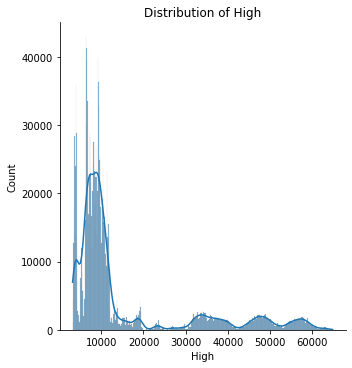

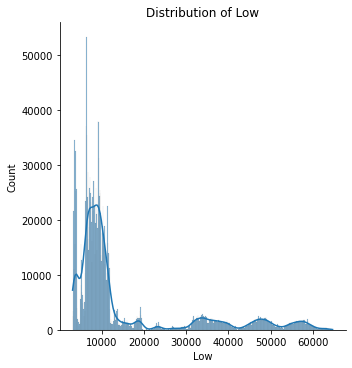

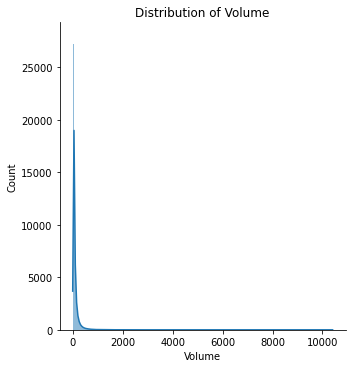

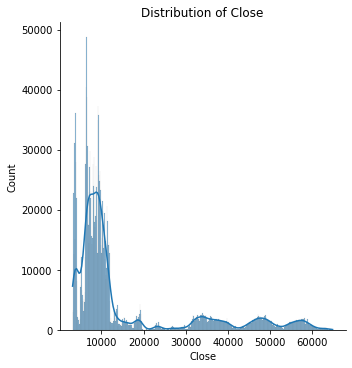

In [52]:
for i in ['Count', 'Open', 'High', 'Low', 'Volume', 'Close']:
    sns.displot(x=i,
                data=btc,
                kde=True)
    plt.title("Distribution of " +  i)
    plt.show()

In [53]:
for i in ['Count', 'Open', 'High', 'Low', 'Volume', 'Close']:
    print(i)
    print("Highest: ", round(btc[i].max(), 2))
    print("Lowest: ", round(btc[i].min(), 2))
    print("Mean: ", round(btc[i].mean(), 2))
    print("Median: ", round(btc[i].median(), 2))
    print("Standard Deviation: ", round(btc[i].std(), 2))
    print("Variance: ", round(btc[i].var(), 2))
    print("--------")

Count
Highest:  87478.0
Lowest:  1.0
Mean:  1082.04
Median:  563.0
Standard Deviation:  1601.67
Variance:  2565354.51
--------
Open
Highest:  64805.94
Lowest:  3149.66
Mean:  15608.68
Median:  9204.97
Standard Deviation:  15119.57
Variance:  228601530.25
--------
High
Highest:  64900.0
Lowest:  3176.91
Mean:  15649.36
Median:  9221.2
Standard Deviation:  15130.2
Variance:  228923036.91
--------
Low
Highest:  64670.53
Lowest:  3120.0
Mean:  15575.61
Median:  9190.26
Standard Deviation:  15104.43
Variance:  228143775.87
--------
Volume
Highest:  10405.0
Lowest:  0.0
Mean:  92.82
Median:  52.79
Standard Deviation:  155.39
Variance:  24145.4
--------
Close
Highest:  64808.54
Lowest:  3151.55
Mean:  15608.68
Median:  9204.93
Standard Deviation:  15119.6
Variance:  228602371.22
--------


In [24]:
min_btc_time=btc.index.min()
max_btc_time=btc.index.max()

print('BTC data goes from ', min_btc_time, 'to', max_btc_time)

BTC data goes from  2018-01-01 00:01:00 to 2021-09-21 00:00:00


In [55]:
min_twt_time=sentiment_df.index.min()
max_twt_time=sentiment_df.index.max()

print('Twitter data goes from ', min_twt_time, 'to', max_twt_time)

Twitter data goes from  2021-02-05 to 2021-12-11


### Bitcoin Price Candlestick Charts

Candlestick chart shows volatility and variance of bitcoin prices in the most recent day.

In [25]:
import plotly.graph_objects as go

fig = go.Figure(data=[go.Candlestick(x=btc_mini.index, open=btc_mini['Open'], high=btc_mini['High'], low=btc_mini['Low'], close=btc_mini['Close'])])
fig.update_layout( title="Bitcoin")
fig.show()

<AxesSubplot:>

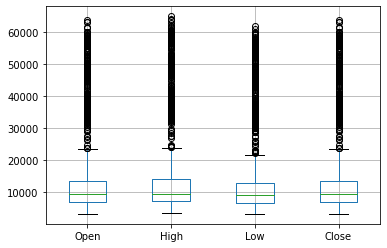

In [56]:
# Visualize bitcoin data in terms of quartiles to identify outliers in the dataset, if any.
btc_daily[['Open','High','Low','Close']].boxplot()

From the chart we can see the data is right skewed.

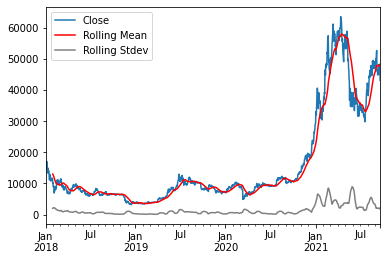

In [61]:
# Visualize bitcoin data in terms of quartiles to identify outliers in the dataset, if any.
ax=btc_daily['Close'].plot()

btc_close = btc_daily['Close']
btc_close

rolling_mean = pd.Series.rolling(btc_close,center=False,window=30).mean()
rolling_std = pd.Series.rolling(btc_close,center=False,window=30).std()
 
plt.plot(rolling_mean,color='red', label='Rolling Mean')
plt.plot(rolling_std,color='gray',label='Rolling Stdev')
plt.legend()

We used rolling mean chart to see if there is any support of monthly average.

## Part 2.2 Bitcoin Tweet Data Set EDA

### Distribution of Negative, Neutral, and Positive Sentiments
The distribution of the sentiments can tell us about the extremes and the average of the bitcoin sentiments.

In [28]:
# Plot the distribution of sentiments
x = ['neg', 'neu', 'pos']
y = [neg.size, neu.size, pos.size]

fig = go.Figure(data=[go.Bar(x=x, y=y,text=y,textposition='auto',)])
fig.show()

Overall the data sentiment seems to be positive for the majority of the tweets. 52.67% of the tweets are positive in nature. Only 11.96% were negative in nature, 35.36% were neutral. This can be skewed because many people tweet to gain traction and encourage others to buy bitcoin. This finding is not surprising as people try to "pump and dump". 

In [29]:
# Distribution of the polarity scores 
import plotly.express as px

fig = go.Figure()
fig.add_trace(go.Box(y=neg['compound'], name='Neg',
                marker_color = 'indianred'))
fig.add_trace(go.Box(y=pos['compound'], name = 'Pos',
                marker_color = 'lightseagreen'))
fig.add_trace(go.Box(y=neu['compound'], name = 'Neu',
                marker_color = 'royalblue'))
fig.show()

It's also no suprise that for tweets that are generally positive, the average is around .57 while for the negative tweets the average is around -.39. What this shows that on average, if it's positive it will be highly positive. When it's negative, then it will not be to the extreme on average. Neutral is not suprising because it was defined with a narrow window.

### Looking at the frequency of words for each sentiment
It would be interesting to see if there were any differences in words between the different sentiments. We used a word cloud to create a visual view of the differences.

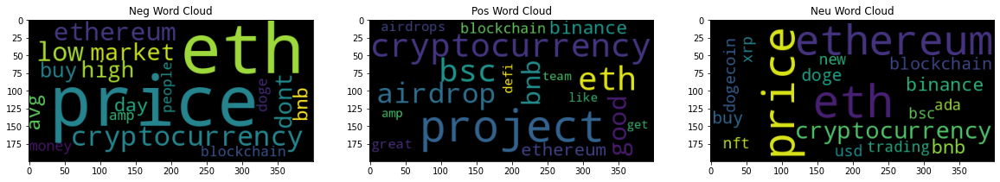

In [30]:
from PIL import Image
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
import matplotlib.pyplot as plt
from collections import Counter

def generate_words(df):
    concat_s = ""
    for s in df['clean_sentence']:
        concat_s += s + ' '
    return concat_s

# Neg Most Common
negh_tokens = [text for text in neg['tokens']]
negh_tokens = [token for sublist in negh_tokens for token in sublist]
negh_tokens = Counter(negh_tokens).most_common(20)[3:] # Remove Bitcoin,BTC, and Crypto (top 2 for each word cloud)


# Pos Most Common
posh_tokens = [text for text in pos['tokens']]
posh_tokens = [token for sublist in posh_tokens for token in sublist]
posh_tokens = Counter(posh_tokens).most_common(20)[3:]  # Remove Bitcoin,BTC, and Crypto(top 2 for each word cloud)


# Neu Most Commonposh_tokens
neuh_tokens = [text for text in neu['tokens']]
neuh_tokens = [token for sublist in neuh_tokens for token in sublist]
neuh_tokens = Counter(neuh_tokens).most_common(20)[3:]  # Remove Bitcoin,BTC, and Crypto(top 2 for each word cloud)

# Plot Subplots 
f, axs = plt.subplots(1,3,figsize=(20,20))

axs[0].title.set_text('Neg Word Cloud')
axs[1].title.set_text('Pos Word Cloud')
axs[2].title.set_text('Neu Word Cloud')

neg_wordcloud = WordCloud()
neg_wordcloud.generate_from_frequencies(dict(negh_tokens))
axs[0].imshow(neg_wordcloud)

pos_wordcloud = WordCloud()
pos_wordcloud.generate_from_frequencies(dict(posh_tokens))
axs[1].imshow(pos_wordcloud)

neu_wordcloud = WordCloud()
neu_wordcloud.generate_from_frequencies(dict(neuh_tokens))
axs[2].imshow(neu_wordcloud)

The top word clouds were unsurprisingly "bitcoin", "btc", and "cryptocurrency". The first three were excluded from the word cloud for the purposes of better visualization in the differeing terms among the diffe rent categories. Interestingly, the negative word cloud emphasized "price", "eth", and had terms like "money", "high", "avg", "low". The positive word cloud focused on words like "project", "good", "team", "great", "like". Neutral word clouds had other types of cryptocurency names like "dogecoin", and "trading", "usd".  

In [31]:
long_df = pd.concat([volume_neg_df, volume_pos_df, volume_neu_df]).sort_values(by='date', ascending=True)

fig = px.bar(long_df, x="date", y="counts", color="label", title="Volume of Tweets by Sentiment")
fig.show()

An important takeaway for this graph to note is that the sampling is not evenly distributed and there are gaps in the data. This can skew the neural network model later in part 4.

### Now lets look at the subplots of timeseries for each variable

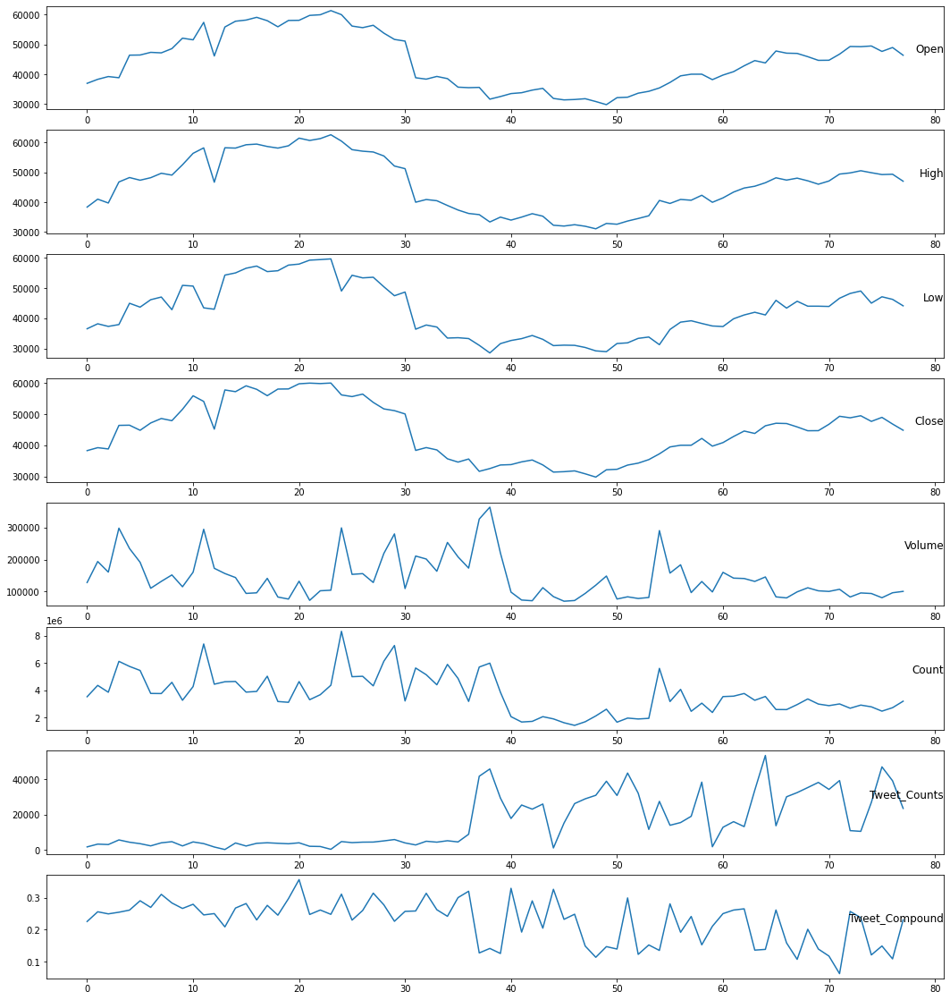

In [66]:
# create subplots of timeseries data for each variable 
v=btc_tweet_daily.values
count=1
plt.figure(figsize=(18, 20))
for i in range(len(btc_tweet_daily.columns)):
 plt.subplot((len(btc_tweet_daily.columns)), 1, count)
 plt.plot(v[:, i])
 plt.title(btc_tweet_daily.columns[i], y=0.5, loc='right')
 count += 1
plt.show()

We can see the Open, High, Low and Close prices are moving in the same trend, and Tweet counts and compound variables are less correlated with the prices.

# Part 3: Building an ARIMA model for Bitcoin closing price prediction
### Looking at ARIMA model first to see how well we can predict using past bitcoin price only

### Verify stationarity
Before we can build an ARIMA model, it is important to verify that the time series is stationary, and if it is not so, then we must take steps to make such time series stationary (by differencing or log transform, etc.). Here we use the Augmented Dickey Fuller test to verify the stationarity, where:
- null hypothesis: time series is not stationary
- alternative hypothesis: time series is stationary 

before transform, failed adfuller test
ADF Statistic: -0.422392
p-value: 0.906293
Critical Values:
	1%: -3.435
	5%: -2.864
	10%: -2.568


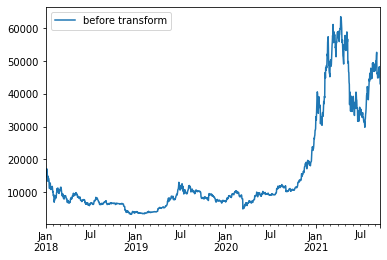

In [33]:
from statsmodels.tsa.stattools import adfuller

X1 = btc_daily[['Close']].rename(columns={"Close": "before transform"})
X1.plot()

def get_adfuller_results(X):
    result = adfuller(X)
    print('ADF Statistic: %f' % result[0])
    print('p-value: %f' % result[1])
    print('Critical Values:')
    for key, value in result[4].items():
        print('\t%s: %.3f' % (key, value))
        
print("before transform, failed adfuller test")
get_adfuller_results(X1.values)


As we can see from the Augmented Dickey Fuller test, p-value > 0.05, we failed to reject the null hypothesis. Hence, we conclude that the daily closing price is not stationary. Therefore, transformation is required to achieve stationarity. In the following, we did a simple d=1 differencing to achieve stationarity.

after transform, passed adfuller test
ADF Statistic: -7.375237
p-value: 0.000000
Critical Values:
	1%: -3.435
	5%: -2.864
	10%: -2.568


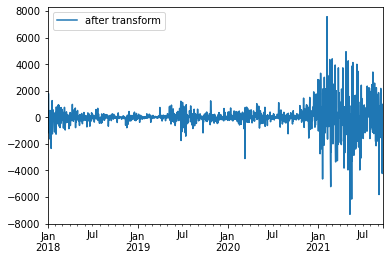

In [34]:
import math

#transform data by differencing, d = 1
def transform_data_d_1(data):        
    t2_data = data[['Close']].shift(periods=-1).dropna()    
    t1_data = data[['Close']][:-1]    
    ratios = (t2_data - t1_data)
    
    return ratios.dropna()

trans_btc = transform_data_d_1(btc_daily)

X2 = trans_btc.rename(columns={"Close": "after transform"})
X2.plot()

print("after transform, passed adfuller test")
get_adfuller_results(X2.values)

We have now achieve stationarity by using d=1 as the degree of differencing.
### Preprocessing closing price data for training
Now we need to reshape the dataset so that it is ready for ARIMA modeling. For X (input) and Y (output) of the model, we let X to be the closing price at time t, and Y be the closing price the day after (i.e. at time t+1). This is a reasonable setup for the training dataset, because a model that can predict a day ahead is already extremely valuable.

Note that we do not do any standardization or normalization, because our dataset is univariate (just 1 feature, closing price), and therefore scaling does not present any benefits for training a model.

In [35]:
import numpy
import matplotlib.pyplot as plt
import math
from sklearn.metrics import mean_squared_error

def create_dataset(dataset, look_back=1):
    dataX, dataY = [], []
    for i in range(len(dataset)-look_back-1):
        a = dataset[i:(i+look_back), 0]
        dataX.append(a)
        dataY.append(dataset[i + look_back, 0])
    return numpy.array(dataX), numpy.array(dataY)

# extract just the closing price values
values = btc_daily[['Close']].reset_index(drop=True).values.astype('float32')

# split into continuous train and test sets
train_size = int(len(btc_daily) * 0.8)
test_size = len(btc_daily) - train_size
train_set, test_set = values[0:train_size,:], values[train_size:len(values),:]

# reshape into X=t and Y=t+1
look_back = 1
trainX, trainY = create_dataset(train_set, look_back)
testX, testY = create_dataset(test_set, look_back)

# reshape input to be [samples, time steps, features]
trainX = numpy.reshape(trainX, (trainX.shape[0], trainX.shape[1], 1))
testX = numpy.reshape(testX, (testX.shape[0], testX.shape[1], 1))

### ARIMA modeling and finding optimal hyperparameters p and q
We will use the pmdarima module to help us with searching for the optimal hyperparameters p and q. Note that we have already shown that for d=1, the time series is stationary. Therefore, we will just assume that d=1 as our initial guess for the ARIMA model. Grid search is used to find the optimal parameters p and q, where the max value for each is 5, just to limit the search space.

In [36]:
!pip install pmdarima
from statsmodels.tsa.arima.model import ARIMA
from matplotlib import pyplot
from pmdarima import auto_arima

     |████████████████████████████████| 1.4 MB 893 kB/s eta 0:00:01


In [37]:
model = auto_arima(train_set, d=1,                                       
                   suppress_warning=True, trace=True, n_jobs=1, stepwise=False)
model.summary()

 ARIMA(0,1,0)(0,0,0)[1] intercept   : AIC=15956.064, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[1] intercept   : AIC=15957.194, Time=0.31 sec
 ARIMA(0,1,2)(0,0,0)[1] intercept   : AIC=15958.339, Time=0.70 sec
 ARIMA(0,1,3)(0,0,0)[1] intercept   : AIC=15958.405, Time=1.07 sec
 ARIMA(0,1,4)(0,0,0)[1] intercept   : AIC=15960.356, Time=1.30 sec
 ARIMA(0,1,5)(0,0,0)[1] intercept   : AIC=15959.330, Time=1.63 sec
 ARIMA(1,1,0)(0,0,0)[1] intercept   : AIC=15957.147, Time=0.26 sec
 ARIMA(1,1,1)(0,0,0)[1] intercept   : AIC=15959.557, Time=0.23 sec
 ARIMA(1,1,2)(0,0,0)[1] intercept   : AIC=inf, Time=1.52 sec
 ARIMA(1,1,3)(0,0,0)[1] intercept   : AIC=15958.697, Time=1.58 sec
 ARIMA(1,1,4)(0,0,0)[1] intercept   : AIC=inf, Time=3.60 sec
 ARIMA(2,1,0)(0,0,0)[1] intercept   : AIC=15958.559, Time=0.16 sec
 ARIMA(2,1,1)(0,0,0)[1] intercept   : AIC=15959.150, Time=0.79 sec
 ARIMA(2,1,2)(0,0,0)[1] intercept   : AIC=15951.752, Time=2.24 sec
 ARIMA(2,1,3)(0,0,0)[1] intercept   : AIC=15961.425, Time=2.04 sec
 ARIMA(

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                 1088
Model:               SARIMAX(2, 1, 2)   Log Likelihood               -7969.876
Date:                Sat, 18 Dec 2021   AIC                          15951.752
Time:                        02:12:56   BIC                          15981.699
Sample:                             0   HQIC                         15963.088
                               - 1088                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      7.8945     41.572      0.190      0.849     -73.584      89.373
ar.L1         -1.7341      0.038    -45.217      0.000      -1.809      -1.659
ar.L2         -0.9355      0.037    -25.082      0.000      -1.009      -0.862
ma.L1          1.7211      0.046     37.554      0.000       1.631       1.811
ma.L2          0.9074      0.045     20.035      0.000       0.819       0.996
sigma2      1.368e+05   2655.346     51.511      0.000    1.32e+05    1.42e+05
===================================================================================
Ljung-Box (L1) (Q):                   0.46   Jarque-Bera (JB):              3898.73
Prob(Q):                              0.50   Prob(JB):                         0.00
Heteroskedasticity (H):               1.09   Skew:                            -0.63
Prob(H) (two-sided):                  0.42   Kurtosis:                        12.19
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

### Compare initial model predictions with test data
For our initial ARIMA model, the optimal parameters are:
- (p, d, q) =  (2, 1, 2)

Let's compare our predictions with the test data

<AxesSubplot:>

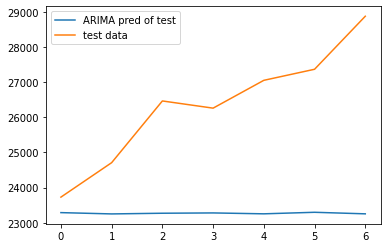

In [38]:
# just compare first 7 days between the prediction and the test data
# pretty bad
pred_test = pd.DataFrame(model.predict(n_periods=7), columns=['ARIMA pred of test'])
pred_test[:].plot(legend=True)
temp_test = pd.DataFrame(test_set[:7], columns=['test data'])
temp_test['test data'][:].plot(legend=True)

<AxesSubplot:>

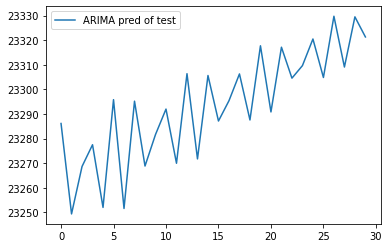

In [39]:
# the predictions have a very small growth rate compared to the test data
pred_test = pd.DataFrame(model.predict(n_periods=30), columns=['ARIMA pred of test'])
pred_test[:].plot(legend=True)

It seems that the model fails to grow at a rate comparable to that of the test data. This suggests that there is a need to increase the degree of difference (the hyperparameter d) to capture the rate of change of change of closing price. For the next iteration, we will let auto_arima to search across parameters p and q, with d=2. We will also expand the search space for the parameters, but instead of using Grid Search, which is very slow, we will use the Stepwise approach which can more quickly search for an optimal model.

In [40]:
model2 = auto_arima(train_set, max_p = 30, 
                    max_q=30,
                    d=2,
                    max_d=5,
                    max_order=70, 
                    suppress_warning=True, trace=True, n_jobs=1, stepwise=True)
model2.summary()

Performing stepwise search to minimize aic
 ARIMA(2,2,2)(0,0,0)[0]             : AIC=inf, Time=1.82 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=16732.047, Time=0.04 sec
 ARIMA(1,2,0)(0,0,0)[0]             : AIC=16390.761, Time=0.08 sec
 ARIMA(0,2,1)(0,0,0)[0]             : AIC=inf, Time=0.18 sec
 ARIMA(2,2,0)(0,0,0)[0]             : AIC=16247.483, Time=0.06 sec
 ARIMA(3,2,0)(0,0,0)[0]             : AIC=16191.451, Time=0.16 sec
 ARIMA(4,2,0)(0,0,0)[0]             : AIC=16135.371, Time=0.21 sec
 ARIMA(5,2,0)(0,0,0)[0]             : AIC=16124.549, Time=0.24 sec
 ARIMA(6,2,0)(0,0,0)[0]             : AIC=16103.149, Time=0.76 sec
 ARIMA(7,2,0)(0,0,0)[0]             : AIC=16098.698, Time=0.99 sec
 ARIMA(8,2,0)(0,0,0)[0]             : AIC=16097.048, Time=1.22 sec
 ARIMA(9,2,0)(0,0,0)[0]             : AIC=16089.830, Time=1.46 sec
 ARIMA(10,2,0)(0,0,0)[0]             : AIC=16086.910, Time=1.70 sec
 ARIMA(11,2,0)(0,0,0)[0]             : AIC=16068.365, Time=2.16 sec
 ARIMA(12,2,0)(0,0,0)[0]     

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                 1088
Model:              SARIMAX(16, 2, 0)   Log Likelihood               -8001.497
Date:                Sat, 18 Dec 2021   AIC                          16036.995
Time:                        02:14:18   BIC                          16121.829
Sample:                             0   HQIC                         16069.108
                               - 1088                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.9730      0.018    -53.379      0.000      -1.009      -0.937
ar.L2         -0.9092      0.030    -30.115      0.000      -0.968      -0.850
ar.L3         -0.8169      0.039    -20.698      0.000      -0.894      -0.740
ar.L4         -0.7698      0.044    -17.549      0.000      -0.856      -0.684
ar.L5         -0.6738      0.045    -15.103      0.000      -0.761      -0.586
ar.L6         -0.6546      0.046    -14.157      0.000      -0.745      -0.564
ar.L7         -0.5888      0.047    -12.415      0.000      -0.682      -0.496
ar.L8         -0.5771      0.045    -12.724      0.000      -0.666      -0.488
ar.L9         -0.5855      0.043    -13.708      0.000      -0.669      -0.502
ar.L10        -0.5502      0.045    -12.130      0.000      -0.639      -0.461
ar.L11        -0.5282      0.049    -10.754      0.000      -0.624      -0.432
ar.L12        -0.4219      0.051     -8.249      0.000      -0.522      -0.322
ar.L13        -0.3378      0.046     -7.398      0.000      -0.427      -0.248
ar.L14        -0.2308      0.042     -5.530      0.000      -0.313      -0.149
ar.L15        -0.1728      0.035     -4.917      0.000      -0.242      -0.104
ar.L16        -0.0868      0.026     -3.330      0.001      -0.138      -0.036
sigma2      1.409e+05   3091.139     45.591      0.000    1.35e+05    1.47e+05
===================================================================================
Ljung-Box (L1) (Q):                   0.05   Jarque-Bera (JB):              3294.64
Prob(Q):                              0.83   Prob(JB):                         0.00
Heteroskedasticity (H):               0.92   Skew:                            -1.03
Prob(H) (two-sided):                  0.40   Kurtosis:                        11.28
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

<AxesSubplot:>

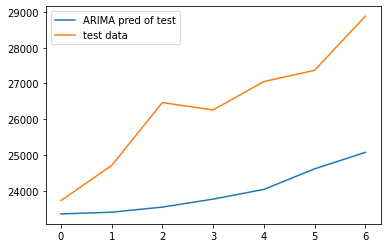

In [41]:
# just compare first 7 days between the prediction and the test data
# slightly better than previous model
pred_test = pd.DataFrame(model2.predict(n_periods=7), columns=['ARIMA pred of test'])
pred_test[:].plot(legend=True)
temp_test = pd.DataFrame(test_set[:7], columns=['test data'])
temp_test['test data'][:].plot(legend=True)

Now we can see that for model2, the prediction Bitcoin closing price grows more rapidly than the previous initial ARIMA model. Note that even though the model2 seems to do a better job of predicting, it actually had a worse AIC value (16037 for model2 and 15952 for the initial model). This is understandable, because the training data just trains the model to predict the closing price a day ahead. The initial model had smaller parameters (2, 1, 2), which is probably better suited for predicting the next closing price value, whereas the model2 had larger lag (16, 2, 0), which may help with predicting price when there is a longer lasting trend in Bitcoin price.



# Part 4: Neural Network

1. Neural Network with Bitcoin Prices
2. Neural Network with Bitcoin Prices and Tweet Volume and Average Sentiment

## Part 4.1 Neural Network with Bitcoin Prices

### **Long Short-Term Memory (LSTM) network**

Given the nature of the bitcoint timeseries data, and the complex problem on sequence prediction, we choose to use the Long Short-Term Memory (LSTM) network to predict the future price vased on previous, sequenctial data. After trying the traditional time series forecasting methods like ARIMA with univariate data, we'd like to explore LSTM with multivariate data. 

In order to prepare data for the LSTM model, we need to convert time series data to supervised learning data so LSTM can learn from the input patterns to predict the output patterns. In this model we are pushing the column forward by 1 to predict the price at t with multivariate inputs at t-1.

In [42]:
def transform(data, num_in, num_out, dropNull=True):
    df = pd.DataFrame(data)
    variables = list() 
    columns =list()
# input variables
    for i in range(data.shape[1]):
        variables += [('Variable%d at t-1' % (i+1))]
    columns.append(df.shift(1))
# forecast output
    for i in range(data.shape[1]):
        variables += [('Output%d at t' % (i+1)) ]
    columns.append(df.shift(-1))
#output input and forcaset sequences in one with no null data
    df = pd.concat(columns, axis=1)
    df.columns = variables
    df.dropna(inplace=True)
    return df

# Normalize the variables and transform it into supervised learning data
values = btc_daily.values 
scaler = MinMaxScaler(feature_range=(0, 1))
scaled = scaler.fit_transform(values)
transformed = transform(scaled, 1, 1)
transformed=transformed.iloc[: , :7]
transformed.head(3)

,Variable1 at t-1,Variable2 at t-1,Variable3 at t-1,Variable4 at t-1,Variable5 at t-1,Variable6 at t-1,Output1 at t
1,0.176004,0.180569,0.163556,0.169381,0.053901,0.022549,0.191128
2,0.169252,0.197737,0.164371,0.191136,0.098461,0.035566,0.196986
3,0.191128,0.199356,0.187334,0.197032,0.078203,0.032063,0.197860


Then we need to define a matrix of input patterns, X, and an array of matching output patterns, y to fit an LSTM with multivariate data. To split the data into train and test, we will use the 80/20 ratio, 80% for traning and 20% for testing. We will first split the data into training set, train, and testing set, test.Then split each train and test into inputs X and output y. We will also keep the data in [samples, timesteps, features] format.

In [43]:
def train_test_split(df, ratio):
    values=df.values
    split = int(ratio * len(values))
    train = values[:split]
    test = values[split:]
    return train, test

# split into train and test
train, test=train_test_split(transformed, 0.8)
# split into input and outputs
train_X, train_y = train[:, :-1], train[:, -1]
test_X, test_y = test[:, :-1], test[:, -1]
# reshape variables to [samples, timesteps, features] format
train_X = train_X.reshape((train_X.shape[0], 1, train_X.shape[1]))
test_X = test_X.reshape((test_X.shape[0], 1, test_X.shape[1]))
print(train_X.shape, train_y.shape, test_X.shape, test_y.shape) 

(1086, 1, 6) (1086,) (272, 1, 6) (272,)


From the shape we can tell we have 1086 training samples, with 1 timestep and 6 features, expecting 1 output; 272 testing samples with 1 timestep and 6 features, expecting 1 output. This is about 3 years of data for training and about 9 months for testing.

### **The LSTM model takes 5 steps:**
1. Define the network
2. Compile the network
3. Fit the network
4. Evaluate the netowrk
5. Preditct 


User settings:

   KMP_AFFINITY=granularity=fine,verbose,compact,1,0
   KMP_BLOCKTIME=0
   KMP_DUPLICATE_LIB_OK=True
   KMP_INIT_AT_FORK=FALSE
   KMP_SETTINGS=1
   KMP_WARNINGS=0

Effective settings:

   KMP_ABORT_DELAY=0
   KMP_ADAPTIVE_LOCK_PROPS='1,1024'
   KMP_ALIGN_ALLOC=64
   KMP_ALL_THREADPRIVATE=128
   KMP_ATOMIC_MODE=2
   KMP_BLOCKTIME=0
   KMP_CPUINFO_FILE: value is not defined
   KMP_DETERMINISTIC_REDUCTION=false
   KMP_DEVICE_THREAD_LIMIT=2147483647
   KMP_DISP_NUM_BUFFERS=7
   KMP_DUPLICATE_LIB_OK=true
   KMP_ENABLE_TASK_THROTTLING=true
   KMP_FORCE_REDUCTION: value is not defined
   KMP_FOREIGN_THREADS_THREADPRIVATE=true
   KMP_FORKJOIN_BARRIER='2,2'
   KMP_FORKJOIN_BARRIER_PATTERN='hyper,hyper'
   KMP_GTID_MODE=3
   KMP_HANDLE_SIGNALS=false
   KMP_HOT_TEAMS_MAX_LEVEL=1
   KMP_HOT_TEAMS_MODE=0
   KMP_INIT_AT_FORK=true
   KMP_LIBRARY=throughput
   KMP_LOCK_KIND=queuing
   KMP_MALLOC_POOL_INCR=1M
   KMP_NUM_LOCKS_IN_BLOCK=1
   KMP_PLAIN_BARRIER='2,2'
   KMP_PLAIN_BARRIER_P

Epoch 1/10
218/218 [==============================] - 3s 5ms/step - loss: 0.0023 - val_loss: 0.0396
Epoch 2/10
218/218 [==============================] - 1s 3ms/step - loss: 8.8069e-04 - val_loss: 0.0100
Epoch 3/10
218/218 [==============================] - 1s 2ms/step - loss: 3.9363e-04 - val_loss: 0.0020
Epoch 4/10
218/218 [==============================] - 1s 2ms/step - loss: 1.8096e-04 - val_loss: 0.0028
Epoch 5/10
218/218 [==============================] - 1s 2ms/step - loss: 1.0202e-04 - val_loss: 0.0044
Epoch 6/10
218/218 [==============================] - 1s 2ms/step - loss: 7.7635e-05 - val_loss: 0.0048
Epoch 7/10
218/218 [==============================] - 1s 2ms/step - loss: 7.0335e-05 - val_loss: 0.0045
Epoch 8/10
218/218 [==============================] - 1s 2ms/step - loss: 6.7719e-05 - val_loss: 0.0038
Epoch 9/10
218/218 [==============================] - 1s 2ms/step - loss: 6.6962e-05 - val_loss: 0.0031
Epoch 10/10
218/218 [==============================] - 1s 2ms/step -

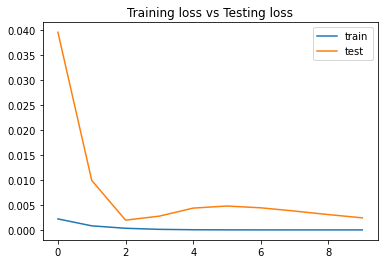

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm (LSTM)                  (None, 45)                9360      
_________________________________________________________________
dense (Dense)                (None, 1)                 46        
Total params: 9,406
Trainable params: 9,406
Non-trainable params: 0
_________________________________________________________________
None


In [44]:
#creating an instance of the squential class
def lstm_constr(model, train_X, train_y, epochs, batch_size):
    # Complile Network with specification on optimization algo and loss function
    model.compile(loss='mean_squared_error', optimizer='adam')
    # Fit Network - Adapt the weights on the training dataset
    fit_model = model.fit(train_X, train_y, 
                          epochs=epochs, 
                          batch_size=batch_size, 
                          validation_data=(test_X, test_y), 
                          shuffle=False)
    # Plot and Evaluate Network
    plt.plot(fit_model.history['loss'], label='train')
    plt.plot(fit_model.history['val_loss'], label='test')
    plt.legend()
    plt.title('Training loss vs Testing loss')
    plt.show()

# Define Network with a sequence of layers.
layers = [LSTM(45), Dense(1)]
btc_model = Sequential(layers)
lstm_constr(btc_model, train_X, train_y, 10, 5)
print (btc_model.summary())

In [45]:
# Step 5 Make a prediction - given the good fit of the model, we are using this model to make prediction on new data
def predict (model, test_X, test_y):
    pred_output = model.predict(test_X)
    test_X = test_X.reshape((test_X.shape[0], test_X.shape[2]))
    inverse_pred = concatenate((pred_output, test_X[:, 1:]), axis=1)
    # invert to show predict in original price form 
    inverse_pred = scaler.inverse_transform(inverse_pred)
    inverse_pred = inverse_pred[:,0]

    # For actual price
    test_y = test_y.reshape((len(test_y), 1))
    inverse_actual = concatenate((test_y, test_X[:, 1:]), axis=1)
    inverse_actual = scaler.inverse_transform(inverse_actual)
    inverse_actual = inverse_actual[:,0]
    # calculate RMSE
    rmse = sqrt(mean_squared_error(inverse_actual, inverse_pred))
    print('The root-mean-square deviation is: %.5f' % rmse)
    return inverse_actual,inverse_pred

inverse_actual,inverse_pred=predict(btc_model, test_X, test_y)

The root-mean-square deviation is: 3008.57978


### Tuning the model with hyperparameters
* lstm = 90, batch_size = 20, epoch = 10 -> RMSE = 18300.76047
* lstm = 60, batch_size = 20, epoch = 10 -> RMSE = 5689.41894
* lstm = 45, batch_size = 20, epoch = 10 -> RMSE = 4780.20007
* lstm = 30, batch_size = 20, epoch = 10 -> RMSE = 5268.46340
* lstm = 45, batch_size = 10, epoch = 10 -> RMSE = 5271.48636
* lstm = 45, batch_size = 5, epoch = 10 -> RMSE = 2947.75580

When epoch goes over 10, test loss starts to rise up quickly, indicating overfitting. Hence we are keeping the epoch at 10.

As shown from above, the combination of 45 neurons in the first layer and 1 neuron in the output layer for the predictin, with a batch_size of 5 yields the best prediction result with the lowest root mean square deviation.  

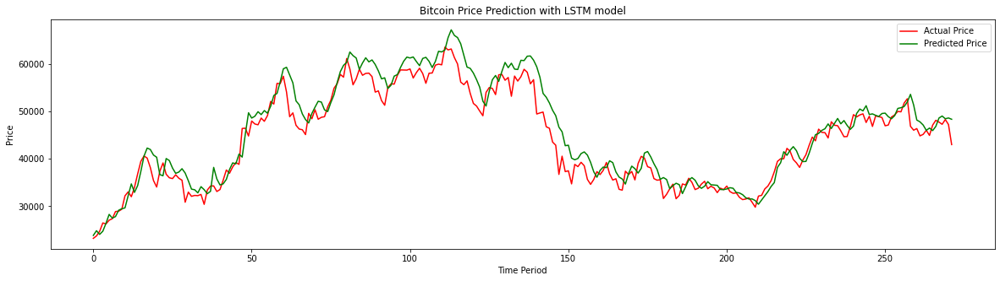

In [46]:
def visualize(inverse_actual,inverse_pred):
    plt.figure(figsize=(20,5))
    plt.plot(inverse_actual, color = 'red', label = 'Actual Price')
    plt.plot(inverse_pred, color = 'green', label = 'Predicted Price')
    plt.xlabel('Time Period')
    plt.ylabel('Price')
    plt.legend()
    plt.title('Bitcoin Price Prediction with LSTM model')
    plt.show()
    
visualize(inverse_actual,inverse_pred)

## Part 4.2 Neural Network with Bitcoin Prices and Tweet Volume and Average Sentiment
Now let's consider the 2 Twitter variables, total tweet counts and the compound sentiment score per day. 

### Hypothesis: 
1. Volume of tweets is has a greater correlation than sentiment of tweets per day with bitcoin prices 
2. If the data was complete, then total volume of tweets will be the best predictor of bitcoin stock prices. Unfortunately our data is incomplete, so it may not help with the model. Because the data is not complete, we can either remove the null or fill in the nulls with 0.
3. Sentiment scores will not correlate well. with  bitcoin stock prices (< 0.5).

In [47]:
btc_tweet_daily_O.corr()

,Open,High,Low,Close,Volume,Count,Tweet_Counts,Tweet_Compound
Open,1.000000,0.999135,0.997598,0.998169,0.142389,0.790580,0.140662,0.392850
High,0.999135,1.000000,0.997127,0.999078,0.154456,0.798506,0.141257,0.391143
Low,0.997598,0.997127,1.000000,0.998349,0.113692,0.765086,0.140446,0.392256
Close,0.998169,0.999078,0.998349,1.000000,0.137208,0.784540,0.142701,0.393291
Volume,0.142389,0.154456,0.113692,0.137208,1.000000,0.578095,-0.109623,-0.030603
Count,0.790580,0.798506,0.765086,0.784540,0.578095,1.000000,0.066089,0.291254
Tweet_Counts,0.140662,0.141257,0.140446,0.142701,-0.109623,0.066089,1.000000,0.559062
Tweet_Compound,0.392850,0.391143,0.392256,0.393291,-0.030603,0.291254,0.559062,1.000000


First try the data removing the nulls from twitter data.

In [67]:
# Normalize the variables and transform it into supervised learning data
values = btc_tweet_daily.values 
scaler = MinMaxScaler(feature_range=(0, 1))
scaled = scaler.fit_transform(values)
transformed = transform(scaled, 1, 1)
transformed=transformed.iloc[: , :9]
transformed.head(3)

,Variable1 at t-1,Variable2 at t-1,Variable3 at t-1,Variable4 at t-1,Variable5 at t-1,Variable6 at t-1,Variable7 at t-1,Variable8 at t-1,Output1 at t
1,0.226709,0.230913,0.257255,0.281374,0.198855,0.304509,0.027719,0.554565,0.298766
2,0.269262,0.315187,0.310030,0.312776,0.422387,0.425259,0.057447,0.657859,0.286231
3,0.298766,0.274384,0.282154,0.299159,0.309748,0.352221,0.052793,0.635643,0.526184


In [72]:
# split into train and test
train, test=train_test_split(transformed, 0.8)
# split into input and outputs
train_X, train_y = train[:, :-1], train[:, -1]
test_X, test_y = test[:, :-1], test[:, -1]
# reshape variables to [samples, timesteps, features] format
train_X = train_X.reshape((train_X.shape[0], 1, train_X.shape[1]))
test_X = test_X.reshape((test_X.shape[0], 1, test_X.shape[1]))
print(train_X.shape, train_y.shape, test_X.shape, test_y.shape)

(60, 1, 8) (60,) (16, 1, 8) (16,)


Epoch 1/10
3/3 [==============================] - 2s 358ms/step - loss: 0.2697 - val_loss: 0.2246
Epoch 2/10
3/3 [==============================] - 0s 17ms/step - loss: 0.2339 - val_loss: 0.1928
Epoch 3/10
3/3 [==============================] - 0s 18ms/step - loss: 0.2029 - val_loss: 0.1640
Epoch 4/10
3/3 [==============================] - 0s 18ms/step - loss: 0.1752 - val_loss: 0.1380
Epoch 5/10
3/3 [==============================] - 0s 27ms/step - loss: 0.1505 - val_loss: 0.1147
Epoch 6/10
3/3 [==============================] - 0s 18ms/step - loss: 0.1286 - val_loss: 0.0942
Epoch 7/10
3/3 [==============================] - 0s 18ms/step - loss: 0.1095 - val_loss: 0.0763
Epoch 8/10
3/3 [==============================] - 0s 18ms/step - loss: 0.0932 - val_loss: 0.0611
Epoch 9/10
3/3 [==============================] - 0s 18ms/step - loss: 0.0794 - val_loss: 0.0485
Epoch 10/10
3/3 [==============================] - 0s 19ms/step - loss: 0.0680 - val_loss: 0.0383


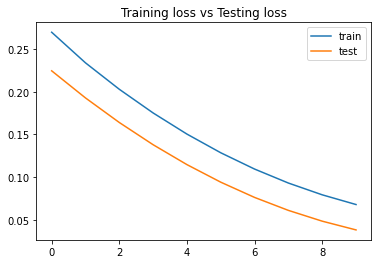

Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_4 (LSTM)                (None, 60)                16560     
_________________________________________________________________
dense_4 (Dense)              (None, 1)                 61        
Total params: 16,621
Trainable params: 16,621
Non-trainable params: 0
_________________________________________________________________
None


In [73]:
#Define model
layers = [LSTM(60), Dense(1)]
btc_twt_nonull_model = Sequential(layers)
lstm_constr(btc_twt_nonull_model, train_X, train_y, 10, 20)
print (btc_twt_nonull_model.summary())

The root-mean-square deviation is: 6181.27490


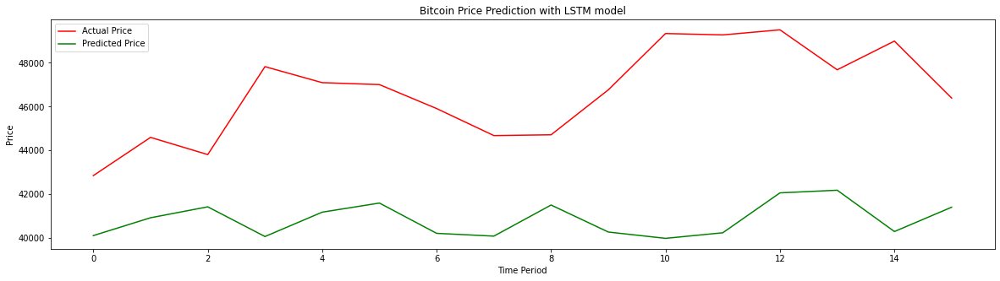

In [74]:
inverse_actual,inverse_pred=predict(btc_twt_nonull_model, test_X, test_y)
visualize(inverse_actual,inverse_pred)

Since twitter data is incomplete, the model is not showing a good prediction. Next, we'd like to try filling in the null values with 0 to keep the complete time series.

In [81]:
# Normalize the variables and transform it into supervised learning data
values = btc_tweet_daily_O.values 
scaler = MinMaxScaler(feature_range=(0, 1))
scaled = scaler.fit_transform(values)
transformed = transform(scaled, 1, 1)
transformed=transformed.iloc[: , :9]
transformed.head(3)

,Variable1 at t-1,Variable2 at t-1,Variable3 at t-1,Variable4 at t-1,Variable5 at t-1,Variable6 at t-1,Variable7 at t-1,Variable8 at t-1,Output1 at t
1,0.217584,0.222541,0.205649,0.211306,0.054014,0.022713,0.0,0.0,0.231944
2,0.211172,0.238829,0.206423,0.231963,0.098569,0.035728,0.0,0.0,0.237507
3,0.231944,0.240365,0.228230,0.237561,0.078313,0.032226,0.0,0.0,0.238336


In [82]:
# split into train and test
train, test=train_test_split(transformed, 0.8)
# split into input and outputs
train_X, train_y = train[:, :-1], train[:, -1]
test_X, test_y = test[:, :-1], test[:, -1]
# reshape variables to [samples, timesteps, features] format
train_X = train_X.reshape((train_X.shape[0], 1, train_X.shape[1]))
test_X = test_X.reshape((test_X.shape[0], 1, test_X.shape[1]))
print(train_X.shape, train_y.shape, test_X.shape, test_y.shape)

(1102, 1, 8) (1102,) (276, 1, 8) (276,)


Epoch 1/10
56/56 [==============================] - 3s 11ms/step - loss: 0.0046 - val_loss: 0.0888
Epoch 2/10
56/56 [==============================] - 0s 3ms/step - loss: 0.0027 - val_loss: 0.0622
Epoch 3/10
56/56 [==============================] - 0s 3ms/step - loss: 0.0015 - val_loss: 0.0292
Epoch 4/10
56/56 [==============================] - 0s 3ms/step - loss: 8.1216e-04 - val_loss: 0.0114
Epoch 5/10
56/56 [==============================] - 0s 3ms/step - loss: 4.1012e-04 - val_loss: 0.0054
Epoch 6/10
56/56 [==============================] - 0s 3ms/step - loss: 2.0079e-04 - val_loss: 0.0057
Epoch 7/10
56/56 [==============================] - 0s 3ms/step - loss: 1.2076e-04 - val_loss: 0.0076
Epoch 8/10
56/56 [==============================] - 0s 3ms/step - loss: 9.9708e-05 - val_loss: 0.0090
Epoch 9/10
56/56 [==============================] - 0s 3ms/step - loss: 9.3555e-05 - val_loss: 0.0098
Epoch 10/10
56/56 [==============================] - 0s 3ms/step - loss: 8.9015e-05 - val_los

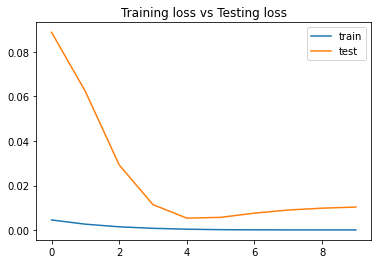

Model: "sequential_6"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_6 (LSTM)                (None, 60)                16560     
_________________________________________________________________
dense_6 (Dense)              (None, 1)                 61        
Total params: 16,621
Trainable params: 16,621
Non-trainable params: 0
_________________________________________________________________
None


In [83]:
layers = [LSTM(60), Dense(1)]
btc_twt_model = Sequential(layers)
lstm_constr(btc_twt_model, train_X, train_y, 10, 20)
print (btc_twt_model.summary())

The root-mean-square deviation is: 6469.84679


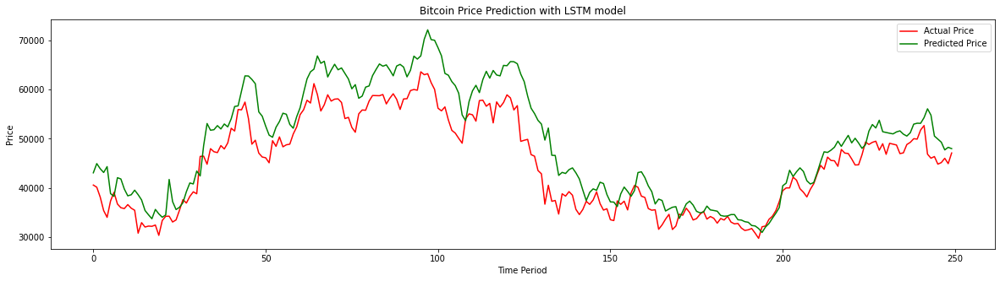

In [84]:
inverse_actual,inverse_pred=predict(btc_twt_model, test_X, test_y)
inverse_actual=inverse_actual[:250]
inverse_pred=inverse_pred[:250]
visualize(inverse_actual,inverse_pred)

## Finding - LSTM model
1. LSTM can model multivariate time series without specifying the time window like used in the ARIMA model. 
2. The model with just bitcoin data performed much better than the ones with the twitter data, which makes sense because the two twitter data inputs are not highly correlated with the bitcoin price. 
3. The performances between the model with twitter data after removing the nulls and the model with twitter data with 0 replacing the nulls are pretty similar. 

## Part 5: Challenges and Obstacles Faced

### 1. Cleaning the data:
* Bitcoin Price Dataset had some missing data, so we had to fill it in and resample to daily.
* Bitcoin Price Dataset  had more samples than Bitcoin Tweet Data Set in terms of data per day. Bitcoin Tweet Data Set were from 2021-02-10 to 2021-12-11, and Bitcoin Price Dataset were from 2021-02-10 to 2021-12-11. This can bias the correlation between volume, sentiment, or price in the Neural Network
* Bitcoin Tweet Data Set had a lot of noise, so many non-stop words were removed including emojis. Bot (repeated post) data was kept in because we thought that the overall volume of the tweets mattered.
* Bitcoin Tweet Data Set was in English, which means that this dataset was not complete in that it is not worldwide.  This is just a subsample taken at a location that was not specified in the original document.

### 2. ARIMA modeling
* Initially, modeling was done at the granularity of minutes, which made it impossible to train the model due to limited memory. We had to resample the data to daily data in order to successfully train the data
* Transformation of the data into a stationary time series required trial and error. Even if the transformed data passed the Augmented Dickey Fuller test, it did not guaranteed successful modeling of the data due to the unpredictable volatility of Bitcoin
* Grid search of the ARIMA parameters was extremely slow. Stepwise search provided a much quicker alternative to find the optimal parameters for the ARIMA model.

### 3. Neural Network Modeling
* LSTM takes multivariate input and one output so we had to shape the data properly with inputs at t-1 and output at t
* The number of training times, epochs, in LSTM has quite random behavior on the performance of trained model. This can easily cause overfitting of the data.
* There are a few parameters to play with to tune the model
* When combining two datasets, we had to be mindful of the missing data and how to keep the time series 

## Future Direction
1. We need a more extensive, accurate dataset for Bitcoin Tweets that is collected every day worldwide. The dataset must be clearer in how the dataset was sampled and where it was sampled. NLTK can handle other languages as well, so if it was extensive, other languages can be included in analysis.
2. It would be interesting to take a closer look at the bot related activity vs. unique posts per day.  Are bots the reason why there is a larger increase in tweet volume and therefore affecting the prices? Or is it driven by unique individuals. In the twitter dataset, there is a column that specified if the user is a verified user. In the future, it would be good to see if this matters or not when considering bitcoin prices.
3. Are the specific types of sentiment analysis driving the price? Maybe it’s not the average sentiment, but a specific sentiment (for example positive sentiment) that correlates better with bitcoin prices. Plugging each one separately into the neural network may provide better results.
4. Since ARIMA modeling that we did was univariate, there were not a lot of opportunities to take in more features to train a more sophisticated model. For future development, it is worth looking into developing a more comprehensive feature set for the LSTM neural network modeling.
5. In general, for time series prediction, we'd like to find more data, or datasets with more complete data, which offers more opportunities to perform exploratory data analysis and tune models.
6. In LSTM we predicted t with t-1 data. With more time, we'd like to play around with different prediction frequency and time period so it could be for longer-term prediction. 

### Thank you for reading! ₿ to the moon!
![](https://www.gannett-cdn.com/media/2021/06/20/USATODAY/usatsports/generic-bitcoin-getty.jpg?width=660&height=440&fit=crop&format=pjpg&auto=webp)